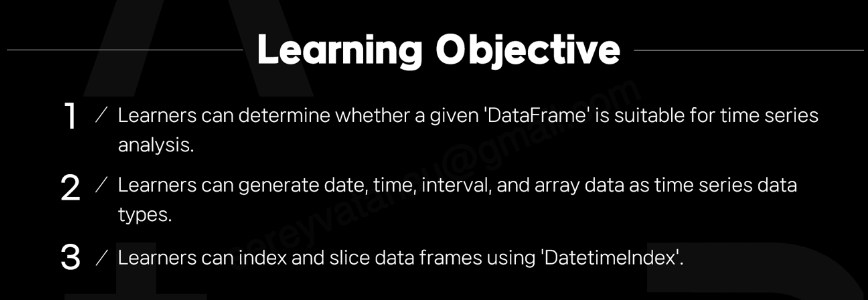

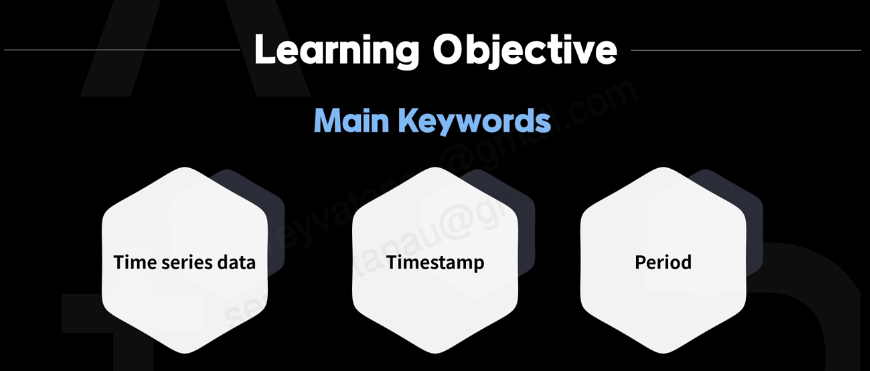

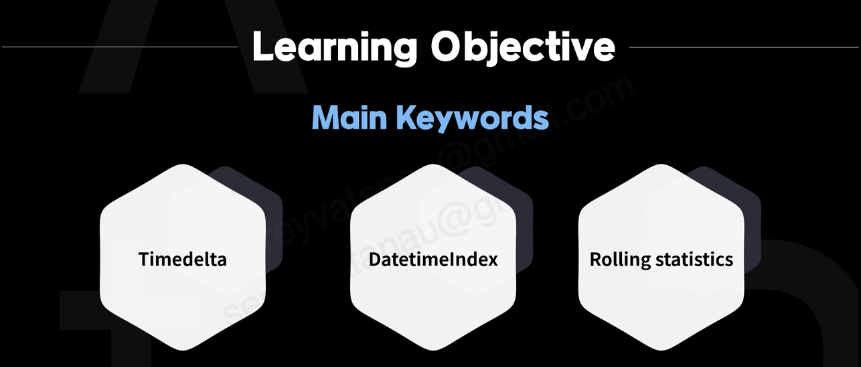

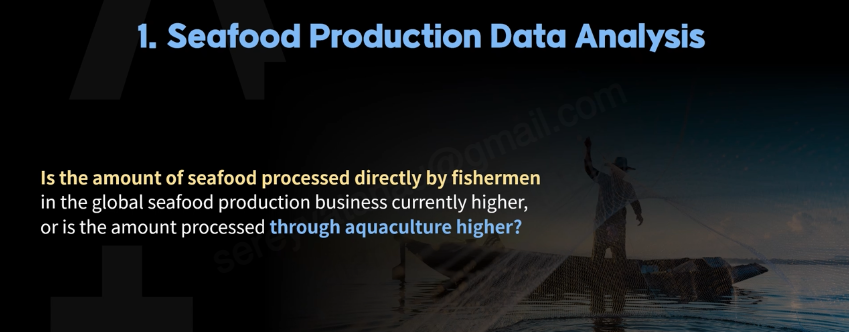

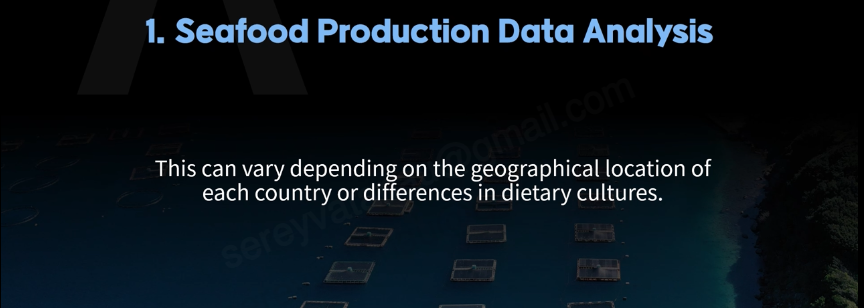

...

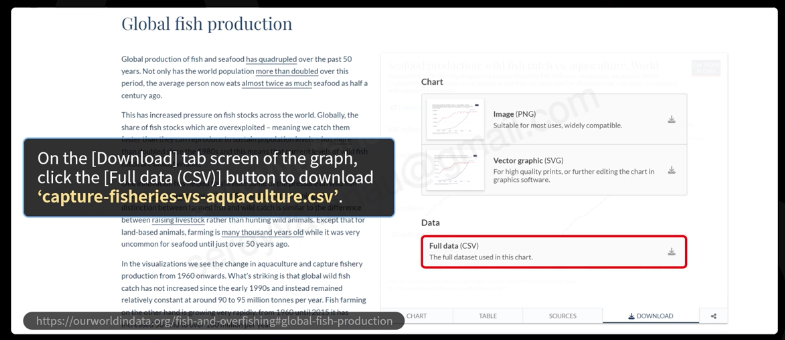

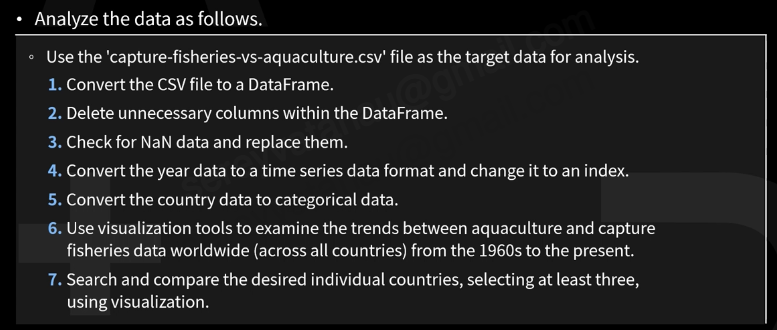

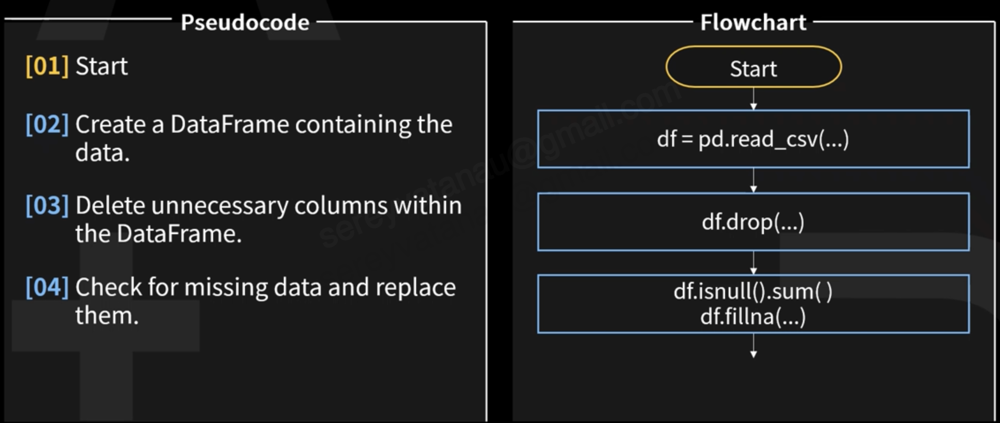

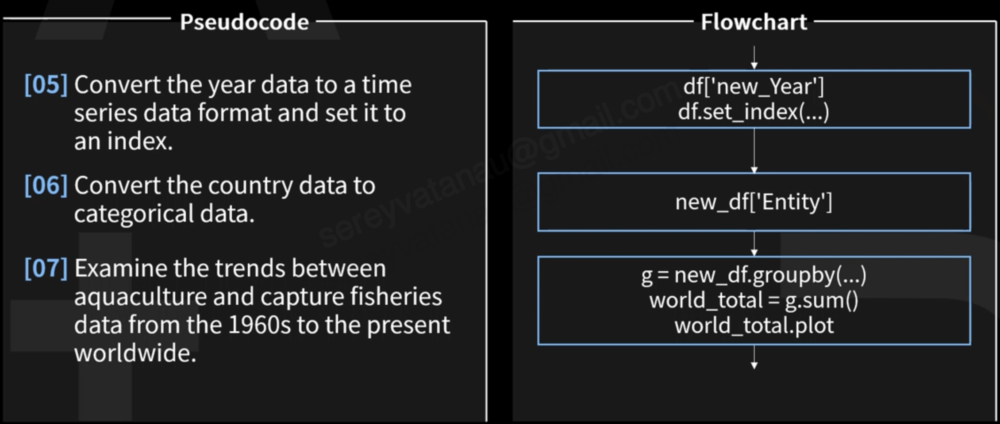

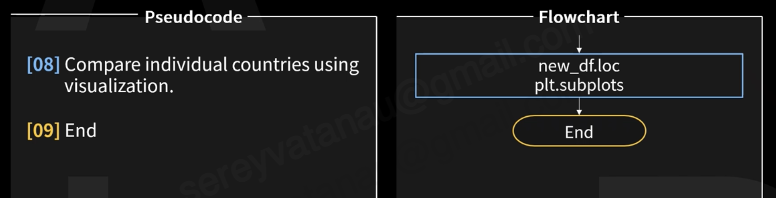

---

#  <span style="color:red">Key Concept</span>

# 1. What is time series data?

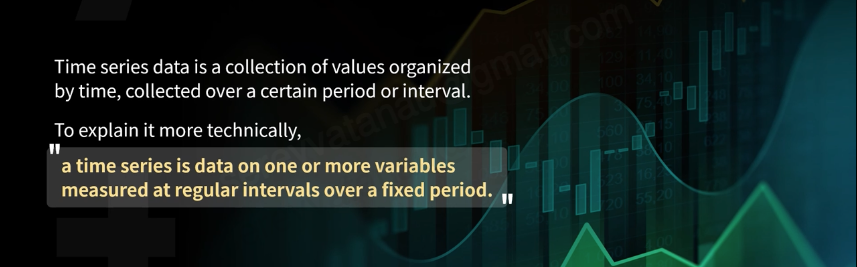

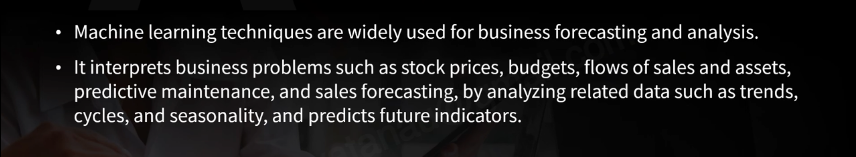

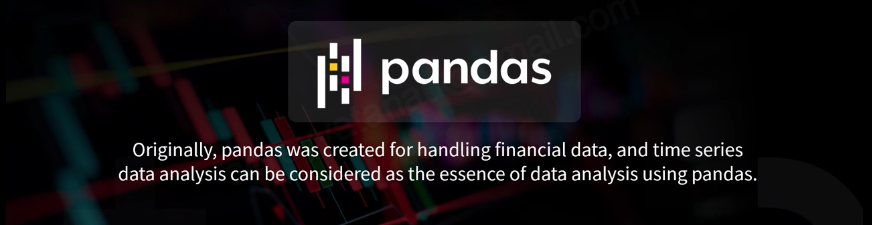

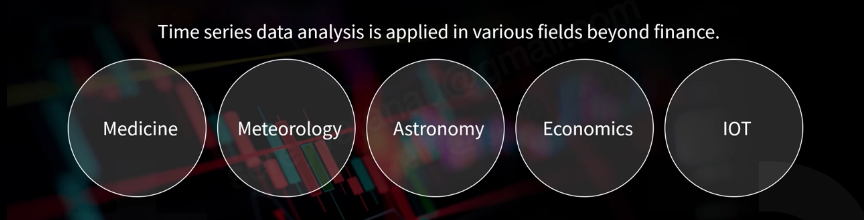

---

# 2. Time series data and analysis widely used in the real world

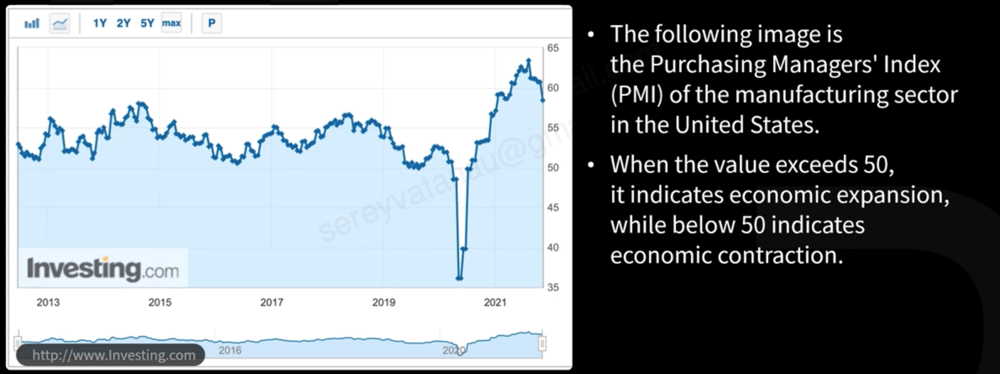

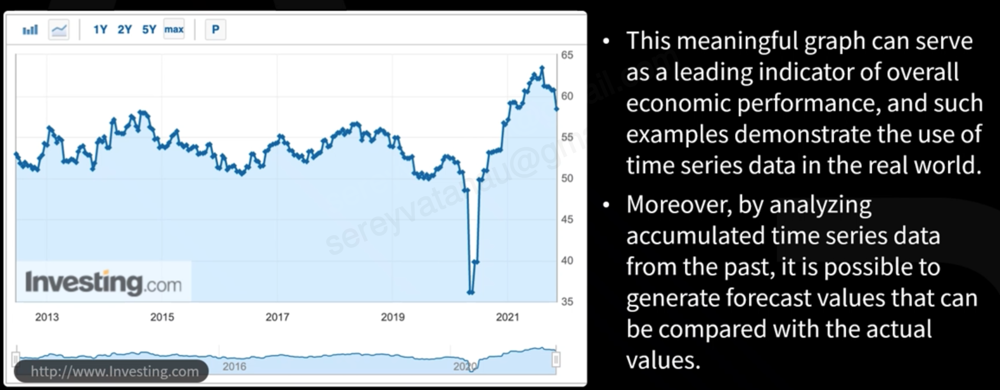

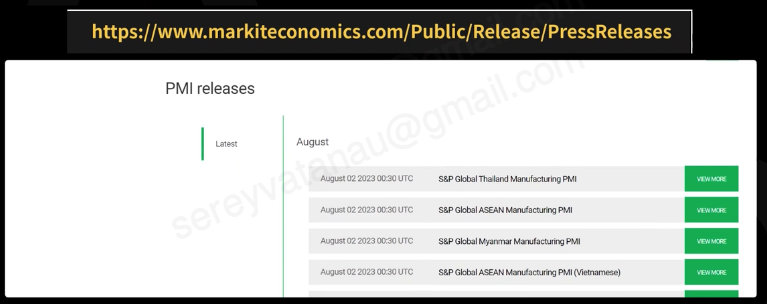

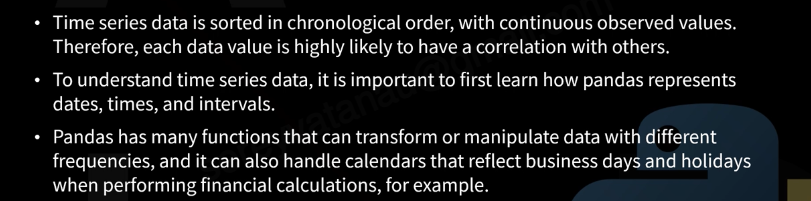

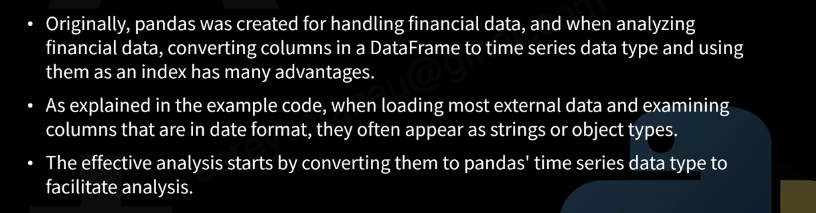

---

# 3. Pandas' time seris data types

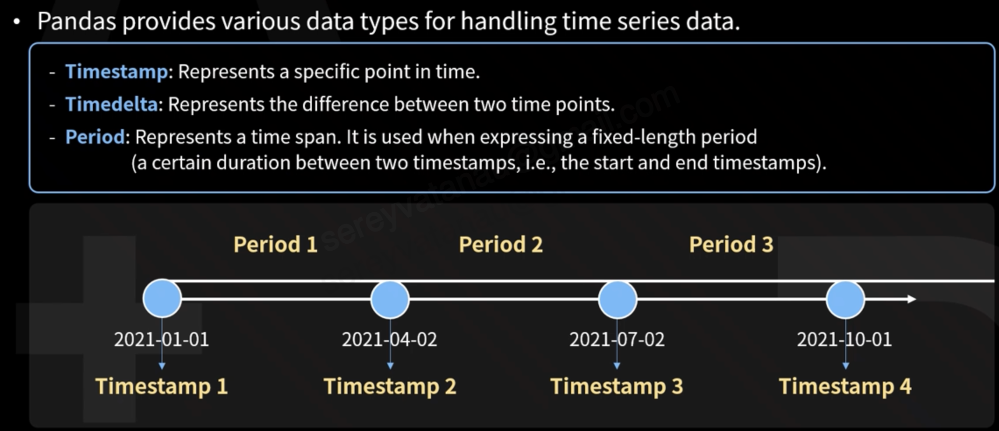

- Multiple timestamps together form an array, which becomes a 'DatetimeIndex'.

- The 'DatetimeIndex' object is an index indexed by timestamps in pandas.

---

# 4. Elements of time series data

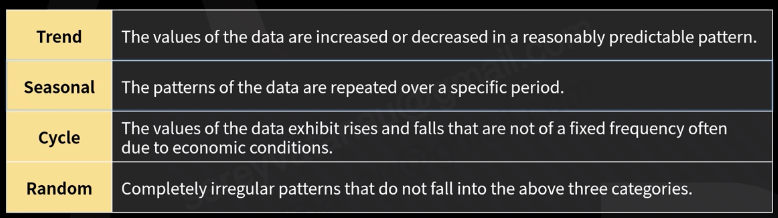

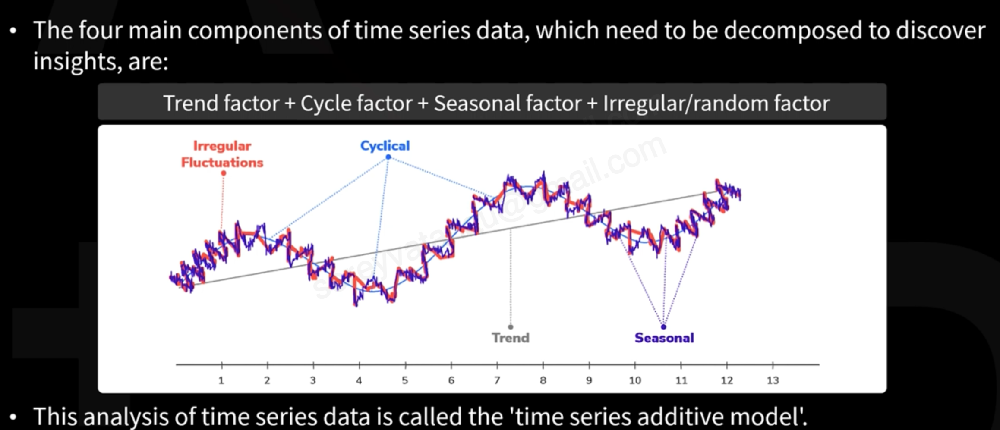

---

# 5. Creating dates, times, frequencies, and time intervals

## 5.1 Creating dates and time using the Python datetime class

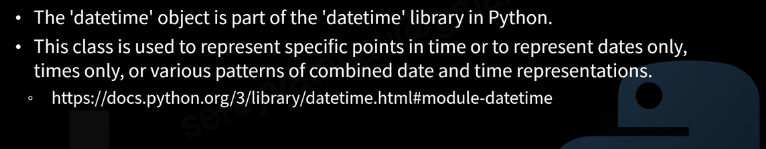

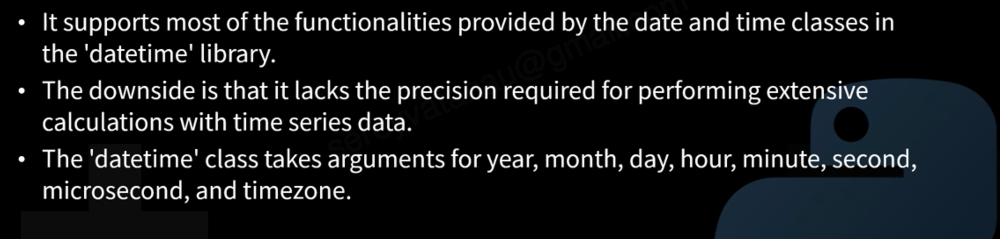

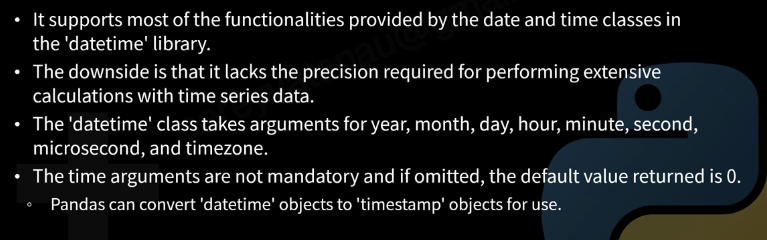

In [3]:
import pandas as pd
import numpy as np
import datetime

from datetime import date, datetime, time, timezone

datetime(2021, 12, 7)

datetime.datetime(2021, 12, 7, 0, 0)

In [4]:
datetime(2021, 7, 7, 15, 50)

datetime.datetime(2021, 7, 7, 15, 50)

In [5]:
d = date(2021, 7, 7)
t = time(13, 26, 10)
datetime.combine(d, t)

datetime.datetime(2021, 7, 7, 13, 26, 10)

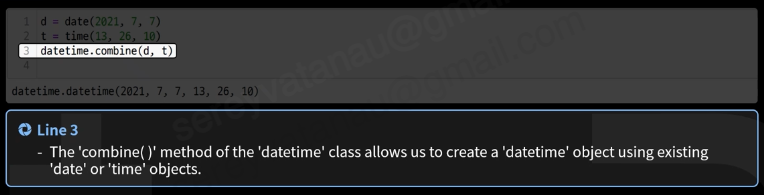

In [6]:
datetime.now()

datetime.datetime(2023, 9, 26, 10, 19, 6, 72988)

In [7]:
datetime.now(timezone.utc)

datetime.datetime(2023, 9, 26, 3, 20, 13, 147026, tzinfo=datetime.timezone.utc)

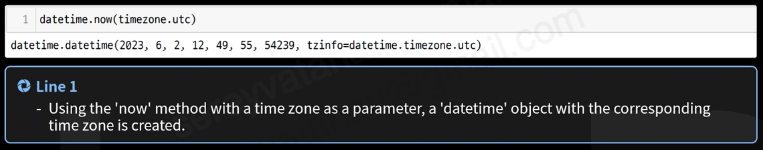

In [8]:
datetime.now().date()

datetime.date(2023, 9, 26)

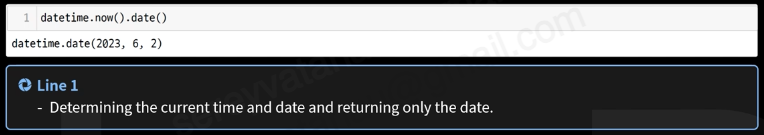

In [9]:
datetime.now().time()

datetime.time(10, 21, 38, 489431)

## 5.2 Creating specific points in time using Pandas timestamp

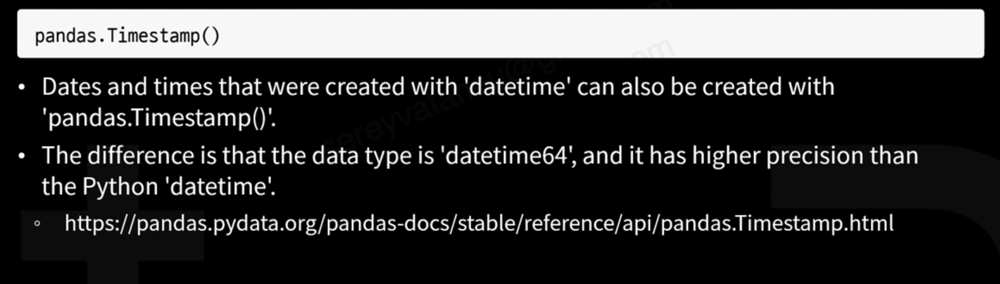

In [11]:
pd.Timestamp('2017, 1, 15')

Timestamp('2017-01-15 00:00:00')

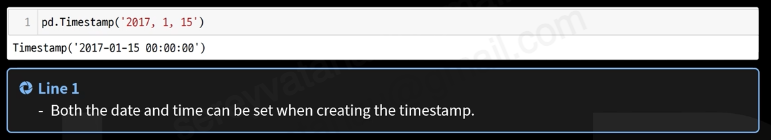

In [12]:
pd.Timestamp('2017, 5, 3, 12:00')

Timestamp('2017-05-03 12:00:00')

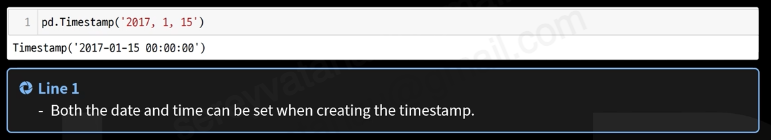

In [13]:
pd.Timestamp('12:00')

Timestamp('2023-09-26 12:00:00')

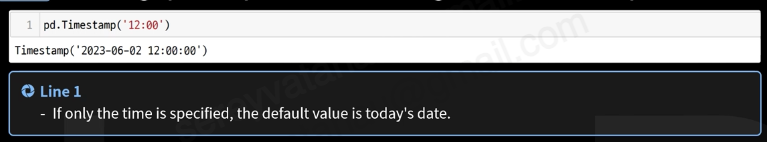

## 5.3 Creating time intervals using Pandas Timedelta

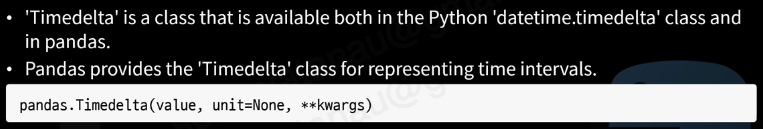

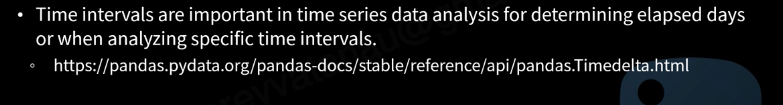

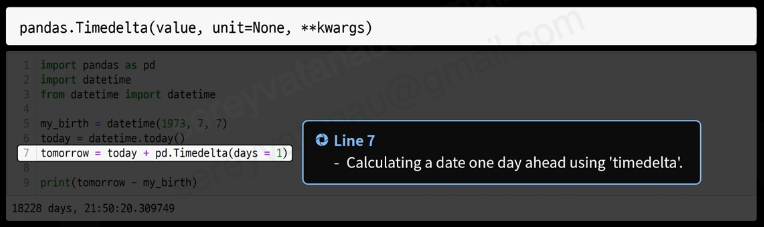

In [17]:
import pandas as pd
import datetime
from datetime import datetime

my_birth = datetime(1973, 7, 7)
today = datetime.today()
tomorrow = today + pd.Timedelta(days = 1)

print(tomorrow - my_birth)

18344 days, 10:29:02.648239


In [18]:
my_birth - today

datetime.timedelta(days=-18344, seconds=48657, microseconds=351761)

In [20]:
today = datetime.today()
data = today + pd.Timedelta(hours = 10)

print(today)
print(data)

2023-09-26 10:30:09.871205
2023-09-26 20:30:09.871205


## 5.4 Expressing periods using Period

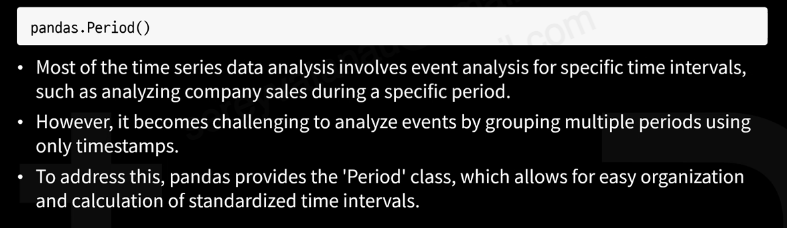

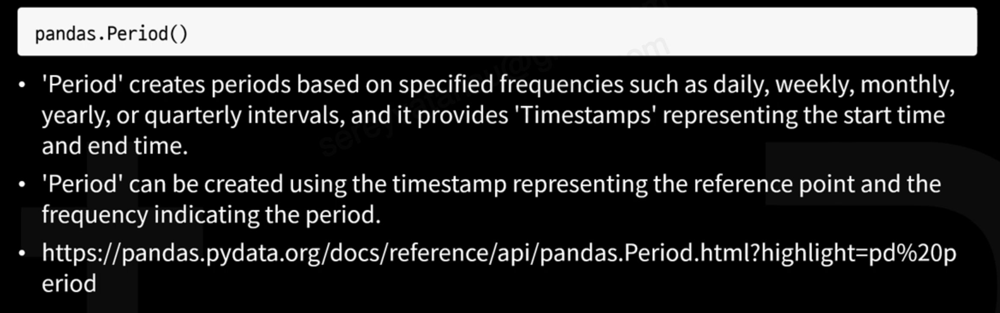

In [21]:
import pandas as pd

special_day = pd.Period('1973-7', freq = 'M')
special_day

Period('1973-07', 'M')

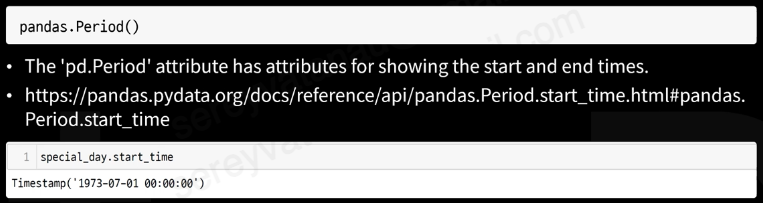

In [22]:
special_day.start_time

Timestamp('1973-07-01 00:00:00')

In [23]:
special_day.end_time

Timestamp('1973-07-31 23:59:59.999999999')

In [24]:
n = special_day + 2

print(special_day)
print(n)

1973-07
1973-09


In [25]:
n.start_time, n.end_time

(Timestamp('1973-09-01 00:00:00'), Timestamp('1973-09-30 23:59:59.999999999'))

---

# 6. Indexing and basic usage of time series data

## 6.1 Converting other data types to Timestamp and indexing with DatetimeIndex

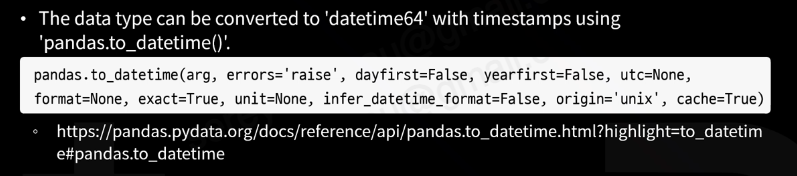

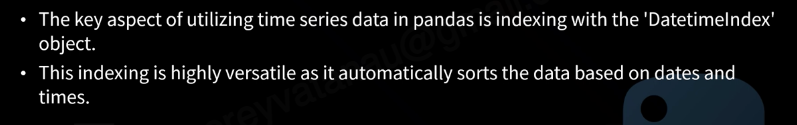

In [45]:
import pandas as pd
wti = pd.read_csv('./data/DCOILWTICO.csv')
wti.head()

,DATE,DCOILWTICO
0,2018-09-18,69.87
1,2018-09-19,71.08
2,2018-09-20,70.77
3,2018-09-21,70.8
4,2018-09-24,73.23


In [46]:
wti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1305 entries, 0 to 1304
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        1305 non-null   object
 1   DCOILWTICO  1305 non-null   object
dtypes: object(2)
memory usage: 20.5+ KB


In [47]:
wti['N_DATE'] = pd.to_datetime(wti['DATE'])
wti['N_DATE']

0      2018-09-18
1      2018-09-19
2      2018-09-20
3      2018-09-21
4      2018-09-24
          ...    
1300   2023-09-12
1301   2023-09-13
1302   2023-09-14
1303   2023-09-15
1304   2023-09-18
Name: N_DATE, Length: 1305, dtype: datetime64[ns]

In [48]:
wti.head()

,DATE,DCOILWTICO,N_DATE
0,2018-09-18,69.87,2018-09-18
1,2018-09-19,71.08,2018-09-19
2,2018-09-20,70.77,2018-09-20
3,2018-09-21,70.8,2018-09-21
4,2018-09-24,73.23,2018-09-24


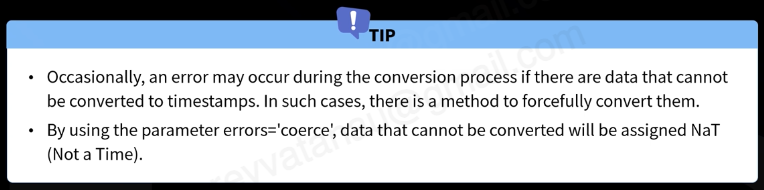

In [49]:
df = wti.drop(['DATE'], axis = 1)
df.head()

,DCOILWTICO,N_DATE
0,69.87,2018-09-18
1,71.08,2018-09-19
2,70.77,2018-09-20
3,70.8,2018-09-21
4,73.23,2018-09-24


In [50]:
df.set_index('N_DATE', inplace = True)
df.head()

,DCOILWTICO
N_DATE,
2018-09-18,69.87
2018-09-19,71.08
2018-09-20,70.77
2018-09-21,70.8
2018-09-24,73.23


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1305 entries, 2018-09-18 to 2023-09-18
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DCOILWTICO  1305 non-null   object
dtypes: object(1)
memory usage: 20.4+ KB


## 6.2 Slicing using DatetimeIndex

In [55]:
df['2018-06-04':'2018-06-10']

,DCOILWTICO
N_DATE,


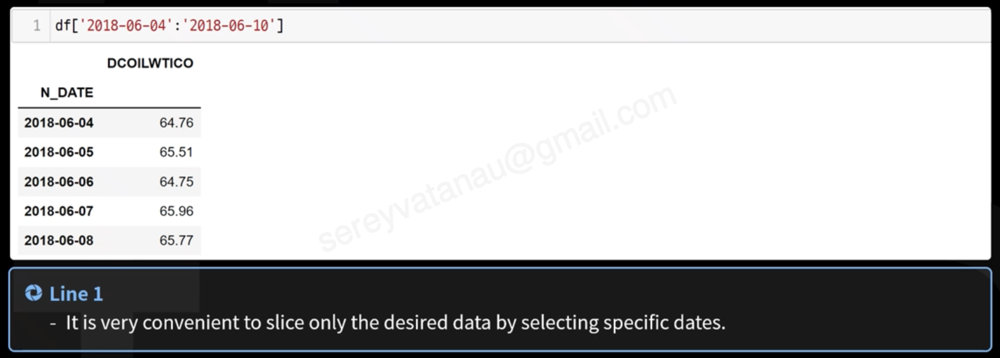

In [54]:
df['2018-06-04' : '2018-06-10']

,DCOILWTICO
N_DATE,


---

# 7. Creating time series data

## 7.1 Generating time series with a specific frequency using a Timestamp array

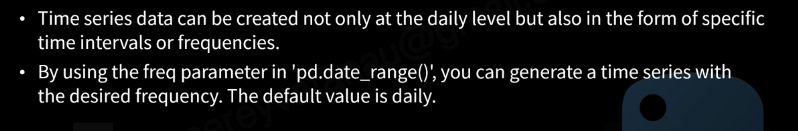

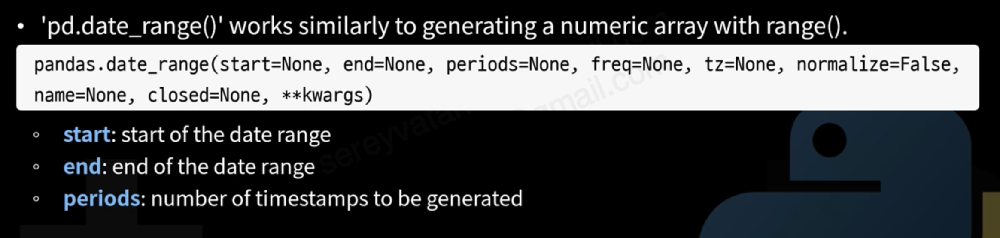

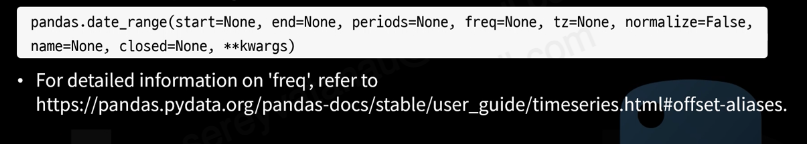

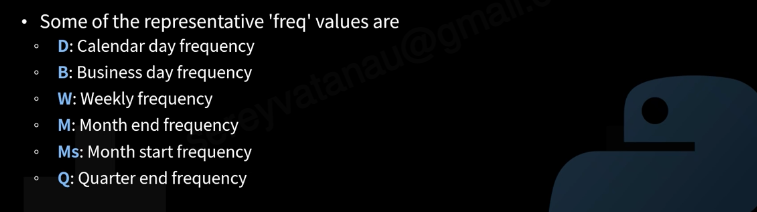

- In the case of a native timezone without setting a timezone, count the number of generated data.

In [56]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'D', tz = None)

DatetimeIndex(['2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04',
               '2021-01-05'],
              dtype='datetime64[ns]', freq='D')

In [57]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'D', tz = 'Asia/Seoul')

DatetimeIndex(['2021-01-01 00:00:00+09:00', '2021-01-02 00:00:00+09:00',
               '2021-01-03 00:00:00+09:00', '2021-01-04 00:00:00+09:00',
               '2021-01-05 00:00:00+09:00'],
              dtype='datetime64[ns, Asia/Seoul]', freq='D')

In [58]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'M', tz = None)

DatetimeIndex(['2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31'],
              dtype='datetime64[ns]', freq='M')

In [59]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'Ms', tz = None)

DatetimeIndex([       '2021-01-01 00:00:00', '2021-01-01 00:00:00.001000',
               '2021-01-01 00:00:00.002000', '2021-01-01 00:00:00.003000',
               '2021-01-01 00:00:00.004000'],
              dtype='datetime64[ns]', freq='L')

## 7.2 Generating time series with a specific frequency using a period array

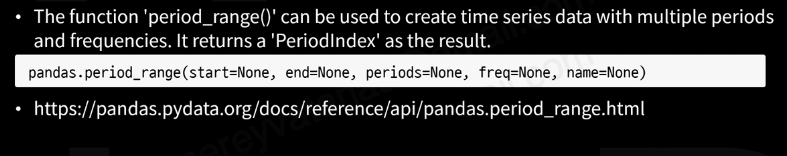

In [60]:
import pandas as pd

p_data = pd.period_range(start = '2020-1-1',
                        end = '2020-12-31',
                        periods = None,
                        freq = 'M')

p_data

PeriodIndex(['2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06',
             '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12'],
            dtype='period[M]')

In [61]:
for i in p_data :
    print('{0} {1}'.format(i.start_time, i.end_time))

2020-01-01 00:00:00 2020-01-31 23:59:59.999999999
2020-02-01 00:00:00 2020-02-29 23:59:59.999999999
2020-03-01 00:00:00 2020-03-31 23:59:59.999999999
2020-04-01 00:00:00 2020-04-30 23:59:59.999999999
2020-05-01 00:00:00 2020-05-31 23:59:59.999999999
2020-06-01 00:00:00 2020-06-30 23:59:59.999999999
2020-07-01 00:00:00 2020-07-31 23:59:59.999999999
2020-08-01 00:00:00 2020-08-31 23:59:59.999999999
2020-09-01 00:00:00 2020-09-30 23:59:59.999999999
2020-10-01 00:00:00 2020-10-31 23:59:59.999999999
2020-11-01 00:00:00 2020-11-30 23:59:59.999999999
2020-12-01 00:00:00 2020-12-31 23:59:59.999999999


---

# 8. Rolling window calculations

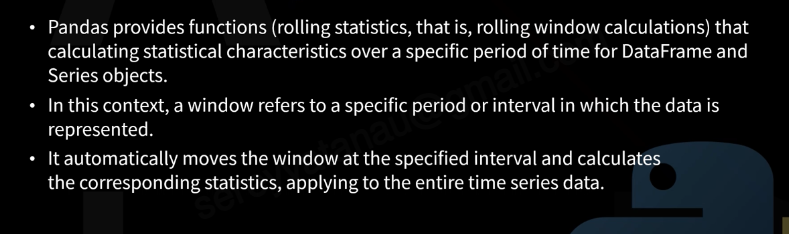

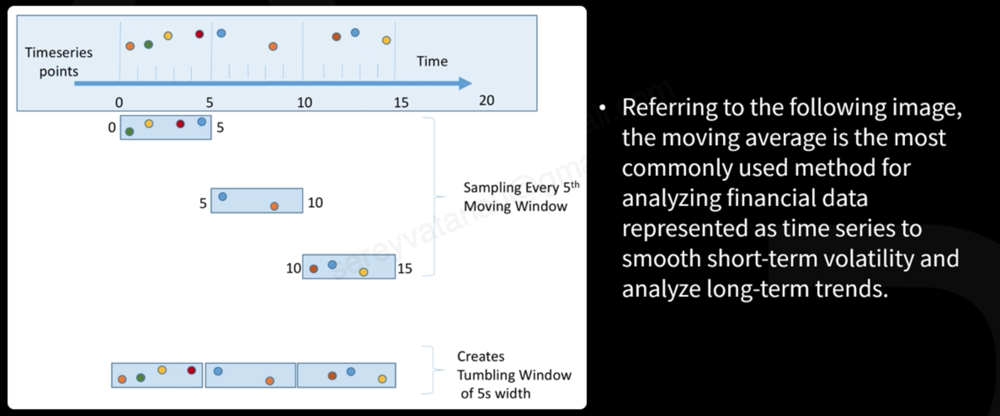

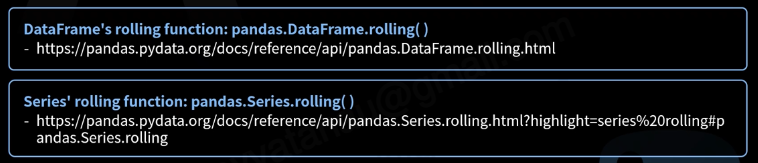

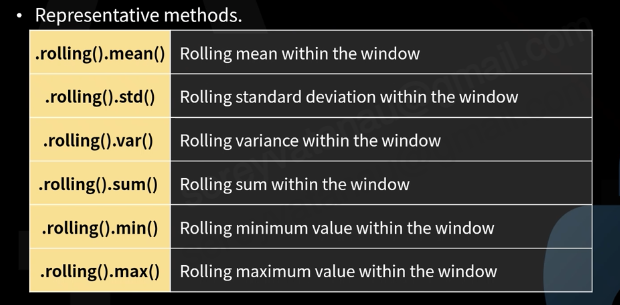

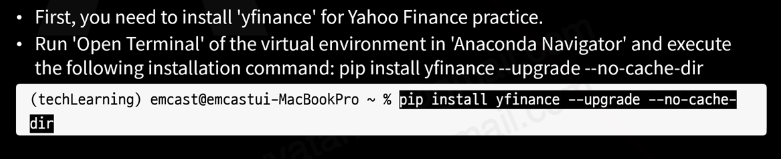

In [62]:
import yfinance as yf

symbol = '005930.KS'
start = '2020-01-01'
end = '2020-12-31'

sec = yf.download(symbol, start = start, end = end)
sec

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,55500.0,56000.0,55000.0,55200.0,50037.406250,12993228
2020-01-03,56000.0,56600.0,54900.0,55500.0,50309.351562,15422255
2020-01-06,54900.0,55600.0,54600.0,55500.0,50309.351562,10278951
2020-01-07,55700.0,56400.0,55600.0,55800.0,50581.289062,10009778
2020-01-08,56200.0,57400.0,55900.0,56800.0,51487.773438,23501171
...,...,...,...,...,...,...
2020-12-23,72400.0,74000.0,72300.0,73900.0,68352.203125,19411326
2020-12-24,74100.0,78800.0,74000.0,77800.0,71959.406250,32502870
2020-12-28,79000.0,80100.0,78200.0,78700.0,72791.843750,40085044


In [63]:
sec.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 248 entries, 2020-01-02 to 2020-12-30
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       248 non-null    float64
 1   High       248 non-null    float64
 2   Low        248 non-null    float64
 3   Close      248 non-null    float64
 4   Adj Close  248 non-null    float64
 5   Volume     248 non-null    int64  
dtypes: float64(5), int64(1)
memory usage: 13.6 KB


In [64]:
ma5 = sec['Adj Close'].rolling(window = 5).mean()
ma5.head(10)

Date
2020-01-02             NaN
2020-01-03             NaN
2020-01-06             NaN
2020-01-07             NaN
2020-01-08    50545.034375
2020-01-09    51161.439844
2020-01-10    51886.619531
2020-01-13    52702.446094
2020-01-14    53463.885156
2020-01-15    53862.732031
Name: Adj Close, dtype: float64

- Let's visualize each moving average data.

Text(0, 0.5, 'close price')

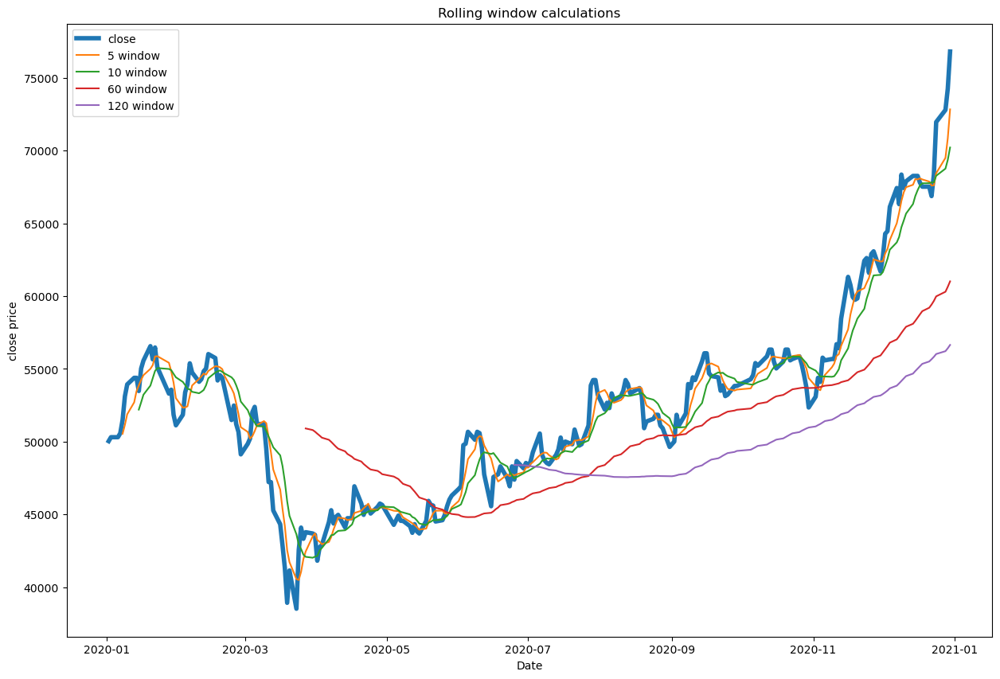

In [66]:
import matplotlib.pyplot as plt

close = sec['Adj Close']

ma5 = close.rolling(window = 5).mean()
ma10 = close.rolling(window = 10).mean()
ma60 = close.rolling(window = 60).mean()
ma120 = close.rolling(window = 120).mean()

plt.figure(figsize = (15, 10))

plt.plot(close, label = 'close', linewidth = 4)
plt.plot(ma5, label = '5 window')
plt.plot(ma10, label = '10 window')
plt.plot(ma60, label = '60 window')
plt.plot(ma120, label = '120 window')

plt.legend()
plt.title('Rolling window calculations')
plt.xlabel('Date')
plt.ylabel('close price')

---

# <span style="color:red">Let's code</span>

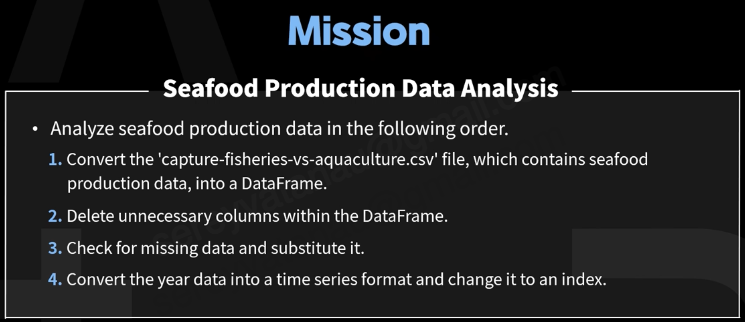

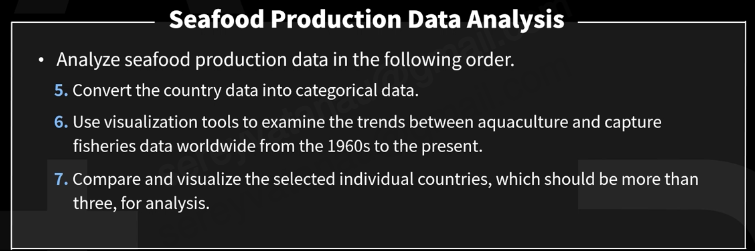

## step1

- Data acquisition and DataFrame conversion.

In [67]:
import pandas as pd

df = pd.read_csv('./data/capture-fisheries-vs-aquaculture.csv')
df.head()

,Entity,Code,Year,Aquaculture production (metric tons),Capture fisheries production (metric tons)
0,Afghanistan,AFG,1969,60.0,400.0
1,Afghanistan,AFG,1970,60.0,400.0
2,Afghanistan,AFG,1971,60.0,500.0
3,Afghanistan,AFG,1972,60.0,500.0
4,Afghanistan,AFG,1973,60.0,500.0


- Check the data types of each column in the DataFrame.

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12727 entries, 0 to 12726
Data columns (total 5 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Entity                                      12727 non-null  object 
 1   Code                                        11842 non-null  object 
 2   Year                                        12727 non-null  int64  
 3   Aquaculture production (metric tons)        9710 non-null   float64
 4   Capture fisheries production (metric tons)  12569 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 497.3+ KB


## Step2

- Data cleaning and preprocessing: Delete unnecessary columns

- Delete the 'Code' column as it is not required for the statistics we are interested in.

In [69]:
df.drop(['Code'], axis = 1, inplace = True)
df.head()

,Entity,Year,Aquaculture production (metric tons),Capture fisheries production (metric tons)
0,Afghanistan,1969,60.0,400.0
1,Afghanistan,1970,60.0,400.0
2,Afghanistan,1971,60.0,500.0
3,Afghanistan,1972,60.0,500.0
4,Afghanistan,1973,60.0,500.0


## Step3

- Data cleaninig and preprocessing: check for missing data and substitue.
- Search for NaN data.

In [70]:
df.isnull().sum()

Entity                                           0
Year                                             0
Aquaculture production (metric tons)          3017
Capture fisheries production (metric tons)     158
dtype: int64

- Create a variable with the desired replacement data.

- Replace NaN with 0 avoid affecting aggregated statistics.

In [71]:
change_value = 0
df.fillna(change_value, inplace = True)
df.isnull().sum()

Entity                                        0
Year                                          0
Aquaculture production (metric tons)          0
Capture fisheries production (metric tons)    0
dtype: int64

## Step4

- Convert to a time series data type and replace the index.

- Since 'Year' is 'int64' data type, an error occurs when trying to change it to 'datetime'. Therefore, it is necessary to change the data type.

- Set the 'new_Year' column, which has been converted to a time series format, as the index.

- Since the original 'Year' column is no longer needed, delete it.

In [73]:
df['new_Year'] = pd.to_datetime(df['Year'].astype(str), format = '%Y')
df.set_index('new_Year', inplace = True)
df.drop(['Year'], axis = 1, inplace = True)

df.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1969-01-01,Afghanistan,60.0,400.0
1970-01-01,Afghanistan,60.0,400.0
1971-01-01,Afghanistan,60.0,500.0
1972-01-01,Afghanistan,60.0,500.0
1973-01-01,Afghanistan,60.0,500.0


- From the results, we can see that it has been changed to a 'DatetimeIndex'.

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12727 entries, 1969-01-01 to 1969-01-01
Data columns (total 3 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Entity                                      12727 non-null  object 
 1   Aquaculture production (metric tons)        12727 non-null  float64
 2   Capture fisheries production (metric tons)  12727 non-null  float64
dtypes: float64(2), object(1)
memory usage: 397.7+ KB


- Sort the DataFrame based on the set index.

In [76]:
new_df = df.sort_index()
new_df.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1960-01-01,Cayman Islands,0.0,0.0
1960-01-01,Bahrain,0.0,1500.0
1960-01-01,North Korea,5236.0,299190.0
1960-01-01,Northern Mariana Islands,0.0,100.0
1960-01-01,Norway,1900.0,1609362.0


## Step5

- Convert to categorical data.

- From the results, we can see that the data type for the country name has been changed from object to categorical.

In [77]:
new_df['Entity'] = new_df['Entity'].astype('category')
new_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12727 entries, 1960-01-01 to 2018-01-01
Data columns (total 3 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   Entity                                      12727 non-null  category
 1   Aquaculture production (metric tons)        12727 non-null  float64 
 2   Capture fisheries production (metric tons)  12727 non-null  float64 
dtypes: category(1), float64(2)
memory usage: 333.1 KB


- There are data available for a total of 264 countries.

In [78]:
new_df['Entity'].value_counts()

Afghanistan                   59
Portugal                      59
Mozambique                    59
Myanmar                       59
Namibia                       59
                              ..
Montenegro                    13
Saint Martin (French part)    12
Curacao                        8
Sint Maarten (Dutch part)      8
South Sudan                    7
Name: Entity, Length: 231, dtype: int64

## Step6

- To observe the trends in global capture fisheries and aquaculture production, we need to sum the catch and aquaculture quantities of each country based on the year.

- Let's use pandas' groupby operation based on the year to calculate the sum of global production (sum of data for each country) for each year and visualize it.

In [79]:
g = new_df.groupby(['new_Year'])

- Group the data by the 'new_Year' column and save it in a new DataFrame called 'g'.

In [80]:
g.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1960-01-01,Cayman Islands,0.00,0.0
1960-01-01,Bahrain,0.00,1500.0
1960-01-01,North Korea,5236.00,299190.0
1960-01-01,Northern Mariana Islands,0.00,100.0
1960-01-01,Norway,1900.00,1609362.0
...,...,...,...
2018-01-01,Slovakia,2224.41,1937.0
2018-01-01,Cayman Islands,0.00,125.0
2018-01-01,Qatar,10.00,14669.0


- Use a loop to print the contents of 'g'.

In [82]:
for key, group in g :
    print('+key:', key)
    print('+number:', len(group))
    print(group.head())
    print('\n')

+key: 1960-01-01 00:00:00
+number: 199
                              Entity  Aquaculture production (metric tons)  \
new_Year                                                                     
1960-01-01            Cayman Islands                                   0.0   
1960-01-01                   Bahrain                                   0.0   
1960-01-01               North Korea                                5236.0   
1960-01-01  Northern Mariana Islands                                   0.0   
1960-01-01                    Norway                                1900.0   

            Capture fisheries production (metric tons)  
new_Year                                                
1960-01-01                                         0.0  
1960-01-01                                      1500.0  
1960-01-01                                    299190.0  
1960-01-01                                       100.0  
1960-01-01                                   1609362.0  


+key: 1961-01

/var/folders/ld/hk2sjq2s4w19vq48d3twmnzh0000gn/T/ipykernel_1913/3114882427.py:1: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for key, group in g :


In [83]:
world_total = g.sum(numeric_only = True)
world_total.head()

,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,
1960-01-01,10977127.0,161077154.0
1961-01-01,10322252.0,180573888.0
1962-01-01,10628086.0,198022581.0
1963-01-01,11882700.0,201874864.1
1964-01-01,12981280.0,226019748.1


- Calculate the sum of each year through the groupby operation and create a new DataFrame with it.

- Visualize the data worldwide.

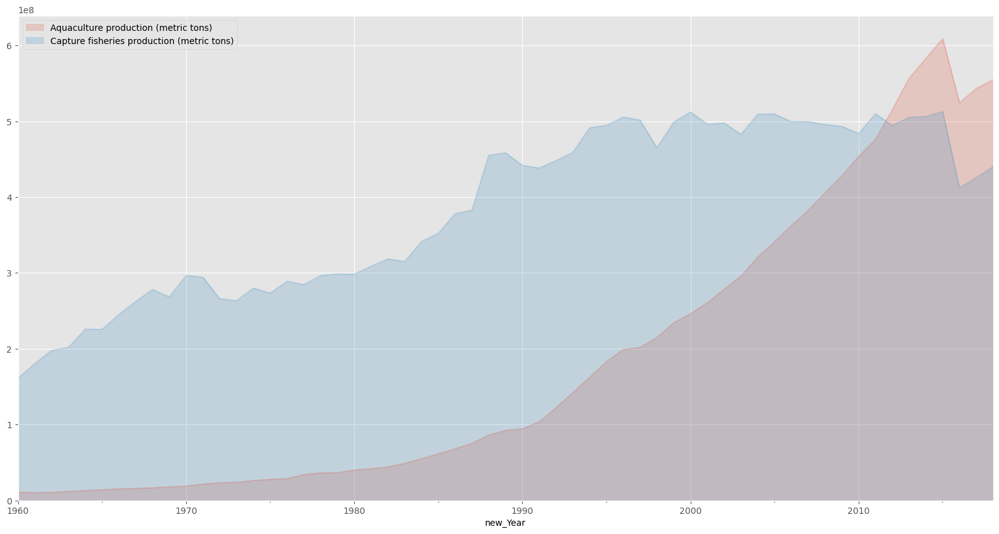

In [84]:
plt.style.use('ggplot')
world_total.plot(kind = 'area',
                alpha = 0.2,
                stacked = False,
                figsize = (20, 10))

plt.legend()
plt.show()

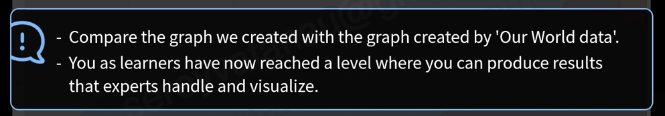

- Specify the style of the graph.

- Draw the line graph as an area graph where teh remaining area is filled with color.

- Adjust the opacity of the colors to enhance visibility for overlapping graphs.

- Set the 'stacked' parameter to 'False'.

- Specify the size of the graph.

- Display the legend

- By checking the results, we can observe that globally, artificial aquaculture production has been increasing more than the catch production since around 2010

## Step7

- Visualize by searching for specific country names.

- If you remember the practice of searching for artist names in the DataFrame lecture, you can easily do this.

In [85]:
country = new_df['Entity'].value_counts()
print(country)
print("Data type =>", type(country))

Afghanistan                   59
Portugal                      59
Mozambique                    59
Myanmar                       59
Namibia                       59
                              ..
Montenegro                    13
Saint Martin (French part)    12
Curacao                        8
Sint Maarten (Dutch part)      8
South Sudan                    7
Name: Entity, Length: 231, dtype: int64
Data type => <class 'pandas.core.series.Series'>


- Generate a series data with only the country column containing unique names to search for countries

- Print the unique country names.

- By checking the processed data type, we can confirm that it has been successfully converted into a series.

In [86]:
'South Korea' in country

True

- Search and visualize at least three countries with different cultural and geographical conditions, and gain insights from the data.

In [87]:
s = new_df.loc[new_df['Entity'] == 'South Korea']
c = new_df.loc[new_df['Entity'] == 'China']
a = new_df.loc[new_df['Entity'] == 'Afghanistan']

- Specify the x-axis and y-axis values to be used in the graph.

In [88]:
s_y = s[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
s_x = s.index

c_y = c[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
c_x = c.index

a_y = a[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
a_x = a.index

Text(0.5, 0.98, 'Fish Production')

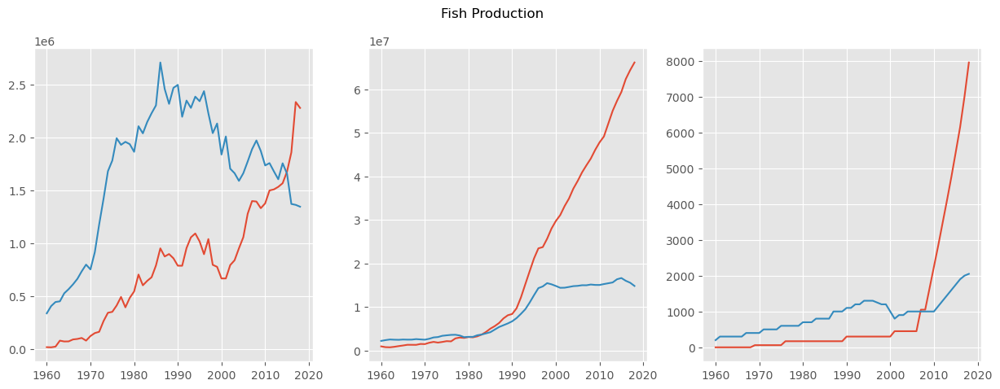

In [90]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
axs[0].plot(s_x, s_y)
axs[1].plot(c_x, c_y)
axs[2].plot(a_x, a_y)

fig.suptitle('Fish Production')

# Finalized Code

        Entity Code  Year  Aquaculture production (metric tons)  \
0  Afghanistan  AFG  1969                                  60.0   
1  Afghanistan  AFG  1970                                  60.0   
2  Afghanistan  AFG  1971                                  60.0   
3  Afghanistan  AFG  1972                                  60.0   
4  Afghanistan  AFG  1973                                  60.0   

   Capture fisheries production (metric tons)  
0                                       400.0  
1                                       400.0  
2                                       500.0  
3                                       500.0  
4                                       500.0  

 <Basic information for data>
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12727 entries, 0 to 12726
Data columns (total 5 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Entity             

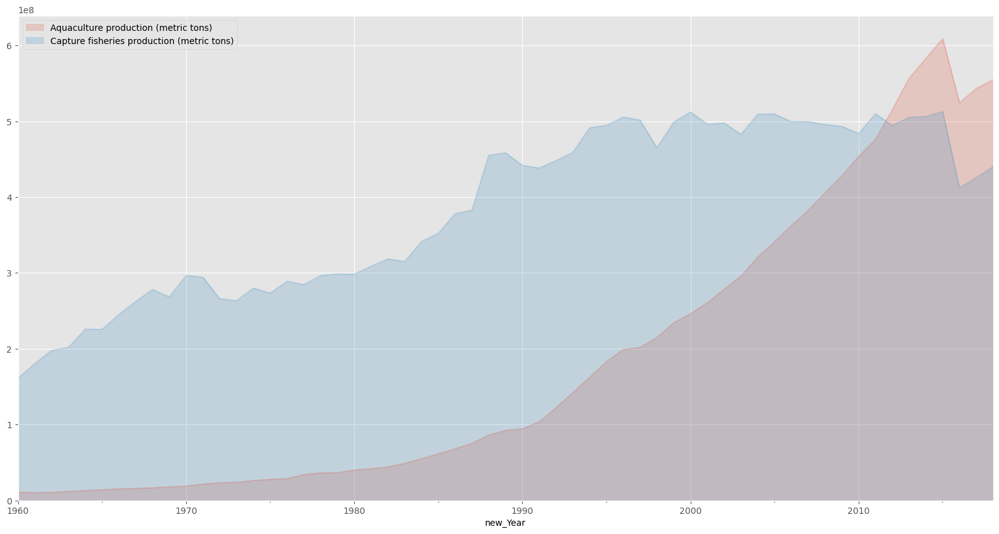


 <Compare visualizations of individual countries>


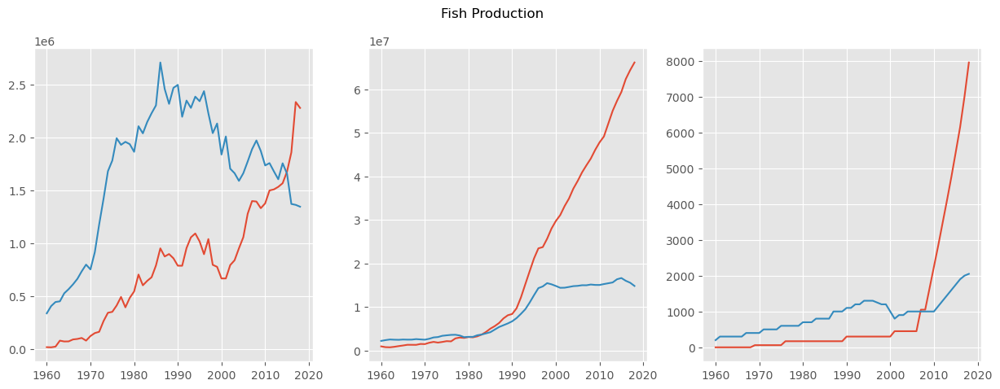

In [92]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('./data/capture-fisheries-vs-aquaculture.csv')
print(df.head())

print('\n <Basic information for data>')
print(df.info())

print('\n <Delete Unnecessary Columns>')
df.drop(['Code'], axis = 1, inplace = True)
print(df.head())

print('\n <Check missing values>')
print(df.isnull().sum())
print('\n => Replace missing value with zero')
change_value = 0
df.fillna(change_value, inplace = True)
print('\n <Check missing values>')
print(df.isnull().sum())

print('\n <Converts year data to time series data types and replaces indexes>')
df['new_Year'] = pd.to_datetime(df['Year'].astype(str), format = '%Y')
df.set_index('new_Year', inplace = True)
df.drop(['Year'], axis = 1, inplace = True)
print(df.head())

print('\n <Convert country data to categorical data>')
new_df['Entity'] = new_df['Entity'].astype('category')
print(new_df.info())

print('\n <Check the number of unique data per country>')
print(new_df['Entity'].value_counts())

print('\n <Trends in data between Aquaculture and Capture fisheries production \
            worldwide from the 1960s to the present>')
g = new_df.groupby(['new_Year'])
world_total = g.sum(numeric_only = True)
plt.style.use('ggplot')
world_total.plot(kind = 'area', alpha = 0.2, stacked = False, figsize = (20, 10))
plt.legend()
plt.show()

print('\n <Compare visualizations of individual countries>')
s = new_df.loc[new_df['Entity'] == 'South Korea']
c = new_df.loc[new_df['Entity'] == 'China']
a = new_df.loc[new_df['Entity'] == 'Afghanistan']
s_y = s[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
s_x = s.index

c_y = c[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
c_x = c.index

a_y = a[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
a_x = a.index
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
axs[0].plot(s_x, s_y)
axs[1].plot(c_x, c_y)
axs[2].plot(a_x, a_y)
fig.suptitle('Fish Production')
plt.show()